# plot on structure

In [1]:
%load_ext autoreload
%reload_ext autoreload
%autoreload 2
import sys
sys.path.append('../../')

import sys, importlib
module_name = "Functions"
if module_name in sys.modules:
    del sys.modules[module_name]
Functions = importlib.import_module(module_name)

from Functions_HuggingFace import *


import re
import py3Dmol
from Bio import PDB, Align
from Bio.SeqUtils import seq1
import os
from collections import defaultdict

In [2]:
# mutations = K_indexed_muts # e.g. ['A145K', 'G158E']
# pdb_path = "4FNK.pdb" # Ensure this file is in your directory
pdb_path="/home3/oml4h/PLM_SARS-CoV-2/Sequences/4WE4_assembly.pdb"
outdir="/home3/oml4h/PLM_SARS-CoV-2/Results/test/"
# view = visualize_mutations_on_pdb(pdb_path, user_k_seq, mutations)
# view.show()
sequences = read_sequences_to_dict('/home3/oml4h/PLM_SARS-CoV-2/Sequences/huH3N2_HA_CDS.translated.fas')
ids=list(sequences.keys())
lineage=[str(x).split("|")[-1] for x in ids]
reference=ids[4]
reference_lineage=lineage[4].split("|")[-1]
print(lineage)
print(ids[2:(len(ids)-1)])
K_indexed_muts = [m for m in get_mutations(sequences[reference],sequences[ids[len(ids)-1]]) if "del" not in m and '-' not in m  ] 

print(K_indexed_muts)

view = visualise_mutations_on_pdb(pdb_path, sequences[ids[len(ids)-1]], K_indexed_muts)
view.show()

['J', 'J', 'J.2', 'J.2', 'J.2.4', 'J.2.4.1']
['EPI2981619|HA|A/Croatia/10136RV/2023|EPI_ISL_18856647|J.2', 'EPI2990337|HA|A/District_Of_Columbia/27/2023|EPI_ISL_18862356|J.2', 'EPI4551140|HA|A/England/415/2024|EPI_ISL_20080368|J.2.4']
['K18N', 'S160N', 'N174D', 'I176K', 'Q189R', 'T344A', 'S394N']
Processing PDB: /home3/oml4h/PLM_SARS-CoV-2/Sequences/4WE4_assembly.pdb
  -> Detected Multimer PDB (will use file content)
  -> Match found on Chain A (Score: 255.0)
  -> Match found on Chain B (Score: 159.0)
  -> Match found on Chain A (Score: 255.0)
  -> Match found on Chain B (Score: 159.0)
  -> Match found on Chain A (Score: 255.0)
  -> Match found on Chain B (Score: 159.0)
  -> Detected 3 models. Adding all models to viewer.
Mapped 5 mutation sites across the structure.
Matched chains: ['A', 'B']


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Entropy shape: (567,)
Probability shape: (567,)
Found 12 positions with mutations in backbone_mut_probs


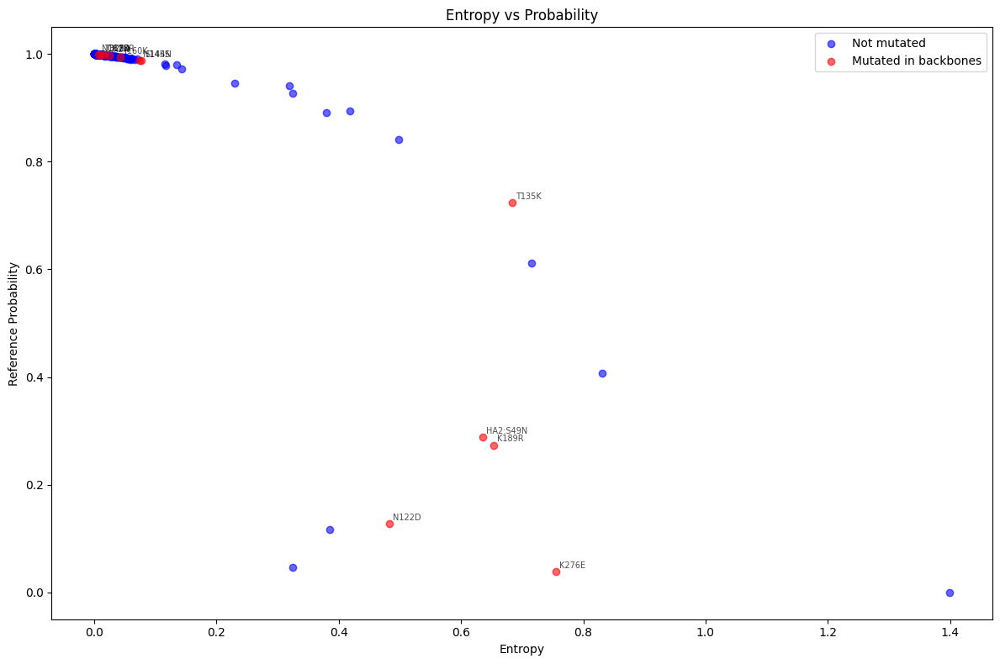

In [3]:
# import entropy and reference

model_name="ESM2-HA80"
model_name="ESM2-H3"
probability=pd.read_csv("/home3/oml4h/PLM_SARS-CoV-2/Results/test/{}_probability.csv".format(model_name))
entropy=pd.read_csv("/home3/oml4h/PLM_SARS-CoV-2/Results/test/{}_entropy.csv".format(model_name))

backbone_mut_probs=pd.read_csv("/home3/oml4h/PLM_SARS-CoV-2/Results/test/H3_epistasis_mutation_info_spyros_model_{}.csv".format(model_name))
mut_combos=pd.read_csv("/home3/oml4h/PLM_SARS-CoV-2/Results/test/{}_mut_info_combos.csv".format(model_name))

# Take the final row and extract columns from position 2 onwards as numpy arrays
entropy_vals = entropy.iloc[-1, 2:].values
probability_vals = probability.iloc[-1, 2:].values

print(f"Entropy shape: {entropy_vals.shape}")
print(f"Probability shape: {probability_vals.shape}")

# Extract position numbers from Mutation column in backbone_mut_probs
def extract_position_from_mutation(mutation_str):
    """Extract numeric position from mutation string like 'A145K' or 'HA2:S49N'"""
    match = re.search(r'[A-Z](\d+)', str(mutation_str))
    if match:
        return int(match.group(1))
    return None

# Create a mapping from position to canonical name
position_to_canon = {}
for _, row in backbone_mut_probs.iterrows():
    pos = extract_position_from_mutation(row['Mutation'])
    if pos is not None and pd.notna(row['canon']):
        # Store all canonical names for this position (in case of multiple)
        if pos not in position_to_canon:
            position_to_canon[pos] = []
        position_to_canon[pos].append(row['canon'])
        
# Create a mapping dictionary from Mutation to canon using backbone_mut_probs
mutation_to_canon_init = dict(zip(backbone_mut_probs['Mutation'], backbone_mut_probs['canon']))
mutation_to_canon = defaultdict(lambda: "Reference", mutation_to_canon_init)
# Map the canonical names to mut_combos
mut_combos["Focal_canon"] = mut_combos["Mutation"].map(mutation_to_canon)

mut_combos["Backbone_canon"] = mut_combos["Backbone"] .map(mutation_to_canon)

# Get unique positions that have mutations
mutated_positions = set(position_to_canon.keys())
print(f"Found {len(mutated_positions)} positions with mutations in backbone_mut_probs")

# Create color array: red if position is in mutated_positions, blue otherwise
# Positions in entropy/probability arrays are 1-indexed
colors = ['red' if (i+1) in mutated_positions else 'blue' for i in range(len(entropy_vals))]

# Create scatter plot with colors
plt.figure(figsize=(12, 8))
for color in ['blue', 'red']:
    mask = [c == color for c in colors]
    label = 'Mutated in backbones' if color == 'red' else 'Not mutated'
    plt.scatter(entropy_vals[mask], probability_vals[mask], 
                c=color, alpha=0.6, label=label)

# Add labels for mutated positions
for i in range(len(entropy_vals)):
    pos = i + 1  # 1-indexed
    if pos in position_to_canon:
        # Join multiple canonical names if there are any
        canon_names = ', '.join(set(position_to_canon[pos]))
        plt.annotate(canon_names, 
                    (entropy_vals[i], probability_vals[i]),
                    fontsize=7, alpha=0.7,
                    xytext=(3, 3), textcoords='offset points')

plt.xlabel("Entropy")
plt.ylabel("Reference Probability")
plt.title("Entropy vs Probability")
plt.legend()
plt.tight_layout()
plt.show()

In [4]:
# Create background_values as a dict with 1-based positions
probability_dict = {i+1: val for i, val in enumerate(probability.iloc[-1, 2:].values)}

view = visualise_mutations_on_pdb(
    pdb_path, 
    sequences[ids[len(ids)-1]], 
    K_indexed_muts,
    background_values=probability_dict,
    title="Reference Probability"
)
view.show()


Processing PDB: /home3/oml4h/PLM_SARS-CoV-2/Sequences/4WE4_assembly.pdb
  -> Detected Multimer PDB (will use file content)
  -> Match found on Chain A (Score: 255.0)
  -> Match found on Chain B (Score: 159.0)
  -> Match found on Chain A (Score: 255.0)
  -> Match found on Chain B (Score: 159.0)
  -> Match found on Chain A (Score: 255.0)
  -> Match found on Chain B (Score: 159.0)
  -> Detected 3 models. Adding all models to viewer.
Mapped 5 mutation sites across the structure.
Matched chains: ['A', 'B']


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [5]:
# Create background_values as a dict with 1-based positions
probability_dict = {i+1:  np.log10(1-val) for i, val in enumerate(probability.iloc[-1, 2:].values)}

view = visualise_mutations_on_pdb(
    pdb_path, 
    sequences[ids[len(ids)-1]], 
    mutation_list=[], #K_indexed_muts,
    background_values=probability_dict,
    title="log10 (1-Reference_Probability)"
)
view.show()
# save plot as interactive html
# Save plot as interactive html
output_path = "{}{}_{}_lin_mutations_probability.html".format(outdir,model_name, reference_lineage)
print(output_path)

# Generate HTML and save it
html_content = view._make_html()
with open(output_path, 'w') as f:
    f.write(html_content)

print(f"Saved to: {output_path}")

Processing PDB: /home3/oml4h/PLM_SARS-CoV-2/Sequences/4WE4_assembly.pdb
  -> Detected Multimer PDB (will use file content)
  -> Match found on Chain A (Score: 255.0)
  -> Match found on Chain B (Score: 159.0)
  -> Match found on Chain A (Score: 255.0)
  -> Match found on Chain B (Score: 159.0)
  -> Match found on Chain A (Score: 255.0)
  -> Match found on Chain B (Score: 159.0)
  -> Detected 3 models. Adding all models to viewer.
Mapped 0 mutation sites across the structure.
Matched chains: []


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

/home3/oml4h/PLM_SARS-CoV-2/Results/test/ESM2-H3_J.2.4_lin_mutations_probability.html
Saved to: /home3/oml4h/PLM_SARS-CoV-2/Results/test/ESM2-H3_J.2.4_lin_mutations_probability.html


In [6]:
# Create background_values as a dict with 1-based positions
entropy_dict = {i+1: val for i, val in enumerate(entropy.iloc[-1, 2:].values)}

view = visualise_mutations_on_pdb(
    pdb_path, 
    sequences[ids[len(ids)-1]], 
    K_indexed_muts,
    background_values=entropy_dict,
    title="Reference entropy"
)
view.show()


Processing PDB: /home3/oml4h/PLM_SARS-CoV-2/Sequences/4WE4_assembly.pdb
  -> Detected Multimer PDB (will use file content)
  -> Match found on Chain A (Score: 255.0)
  -> Match found on Chain B (Score: 159.0)
  -> Match found on Chain A (Score: 255.0)
  -> Match found on Chain B (Score: 159.0)
  -> Match found on Chain A (Score: 255.0)
  -> Match found on Chain B (Score: 159.0)
  -> Detected 3 models. Adding all models to viewer.
Mapped 5 mutation sites across the structure.
Matched chains: ['A', 'B']


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [7]:
# Create background_values as a dict with 1-based positions
entropy_dict = {i+1:  np.log10(val) for i, val in enumerate(entropy.iloc[-1, 2:].values)}

view = visualise_mutations_on_pdb(
    pdb_path, 
    sequences[ids[len(ids)-1]], 
    K_indexed_muts,
    background_values=entropy_dict,
    title="Reference entropy"
)
view.show()


Processing PDB: /home3/oml4h/PLM_SARS-CoV-2/Sequences/4WE4_assembly.pdb
  -> Detected Multimer PDB (will use file content)
  -> Match found on Chain A (Score: 255.0)
  -> Match found on Chain B (Score: 159.0)
  -> Match found on Chain A (Score: 255.0)
  -> Match found on Chain B (Score: 159.0)
  -> Match found on Chain A (Score: 255.0)
  -> Match found on Chain B (Score: 159.0)
  -> Detected 3 models. Adding all models to viewer.
Mapped 5 mutation sites across the structure.
Matched chains: ['A', 'B']


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [8]:
from Bio import SeqIO

query_path = "/home3/oml4h/PLM_SARS-CoV-2/Sequences/huH3N2_HA_CDS.translated.fas"
reference_path = "/home3/oml4h/PLM_SARS-CoV-2/Sequences/H3N2_canonical.fa"

# 1. Read the reference sequence (Assuming single sequence in file)
# We use 'next' to get the first item from the iterator
ref_record = next(SeqIO.parse(reference_path, "fasta"))
ref_seq_str = str(ref_record.seq)



# 2. Read the query sequences
# We parse the file and pick the first one as a test case
query_iterator = SeqIO.parse(query_path, "fasta")
first_query_record = next(query_iterator)

h3_map_with_ha2 = create_h3_numbering_map(first_query_record, ref_seq_str, HA2_start=330)

# Convert your mutations to canonical numbering
canonical_mutations = mutations_to_canonical(K_indexed_muts, h3_map_with_ha2)


# 3. Run the mapping function
# Note: We pass the whole record for the query, and the string for the reference
h3_map = create_h3_numbering_map(first_query_record, ref_seq_str)

# 4. Verify Output
print(f"Generated H3 map for: {first_query_record.id}")
print(f"Total mapped positions: {len(h3_map)}")
print("Sample (first 5 positions):", list(h3_map.items())[:5])

Generated H3 map for: EPI2178977|HA|A/Thailand/8/2022|EPI_ISL_14991375|J
Total mapped positions: 567
Sample (first 5 positions): [(0, 'SP-15'), (1, 'SP-14'), (2, 'SP-13'), (3, 'SP-12'), (4, 'SP-11')]


In [9]:
# Example: Convert mutations to canonical H3 numbering
# First, create h3_map with HA2_start parameter (HA2 typically starts around position 329)
h3_map_with_ha2 = create_h3_numbering_map(first_query_record, ref_seq_str, HA2_start=330)

# Convert your mutations to canonical numbering
canonical_mutations = mutations_to_canonical(K_indexed_muts, h3_map_with_ha2)

print("Original mutations (sequence numbering):")
print(K_indexed_muts[:10])  # Show first 10
print("\nCanonical mutations (H3 numbering):")
print(canonical_mutations[:10])  # Show first 10


Original mutations (sequence numbering):
['K18N', 'S160N', 'N174D', 'I176K', 'Q189R', 'T344A', 'S394N']

Canonical mutations (H3 numbering):
['K2N', 'S144N', 'N158D', 'I160K', 'Q173R', 'T328A', 'HA2:S49N']


In [10]:

view = visualise_mutations_on_pdb(
    pdb_path, 
    sequences[ids[len(ids)-1]], 
    K_indexed_muts,
    background_values=entropy_dict,
    title="Reference entropy",
    canonical_map=h3_map  # Now displays H3 canonical numbering in separate legend
)
view.show()

Processing PDB: /home3/oml4h/PLM_SARS-CoV-2/Sequences/4WE4_assembly.pdb
  -> Detected Multimer PDB (will use file content)
  -> Match found on Chain A (Score: 255.0)
  -> Match found on Chain B (Score: 159.0)
  -> Match found on Chain A (Score: 255.0)
  -> Match found on Chain B (Score: 159.0)
  -> Match found on Chain A (Score: 255.0)
  -> Match found on Chain B (Score: 159.0)
  -> Detected 3 models. Adding all models to viewer.
Mapped 5 mutation sites across the structure.
Matched chains: ['A', 'B']


Mutation,Seq Position,Canonical
K18N,18,2
S160N,160,144
N174D,174,158
I176K,176,160
Q189R,189,173
T344A,344,328
S394N,394,378


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [11]:
# 1. Setup Input Data
# The parent header provided
parent_header = "EPI4551140|HA|A/England/415/2024|EPI_ISL_20080368|J.2.4"

# PLACEHOLDER: Replace this string with your actual amino acid sequence for EPI4551140
# I have made this long enough to cover the T328A mutation position
parent_sequence = read_sequences_to_dict('/home2/oml4h/PLM_SARS-CoV-2/Sequences/huH3N2_HA_CDS.translated.fas')
parent_sequence=parent_sequence[parent_header]
# 2. Define the mutation steps
# Each step is a list of mutations to apply cumulatively to the previous result

#
steps_canonical = [
    ['I160K'],              # Step 1
    ['N158D', 'T328A'],     # Step 2
    ['S144N']               # Step 3
]

steps = [
    ['I176K'],              # Step 1
    ['N174D', 'T344A'],     # Step 2
    ['S160N']               # Step 3
]


# 3. Iterative Generation
current_sequence = parent_sequence
current_suffix = "" # Used to build the cumulative name part

print(f"Original Header: >{parent_header}\n")

for step_i, step_mutations in enumerate(steps):
    # Apply new mutations to the sequence from the PREVIOUS step
    # This works because mutate_sequence returns a full string, which becomes the input for the next round
    current_sequence = mutate_sequence(current_sequence, step_mutations)
    
    # Build the name suffix (e.g., _I160K then _I160K_N158D_T328A)
    # We join mutations with underscore and add them to the running suffix
    step_suffix = "_" + "_".join(steps_canonical[step_i])
    current_suffix += step_suffix
    
    # Construct the new header
    # We take the parent header and simply append the cumulative suffix
    new_header = f"{parent_header}{current_suffix}"
    
    # Print in FASTA format
    print(f">{new_header}")
    print(current_sequence)
    print() # Newline for readability

Original Header: >EPI4551140|HA|A/England/415/2024|EPI_ISL_20080368|J.2.4

>EPI4551140|HA|A/England/415/2024|EPI_ISL_20080368|J.2.4_I160K
MKAIIALSNILCLVFAQKIPGNDNSTATLCLGHHAVPNGTIVKTITNDRIEVTNATELVQNSSIGKICNSPHQILDGGNCTLIDALLGDPQCDGFQNKEWDLFVERSRANSSCYPYDVPDYASLRSLVASSGTLEFKDESFNWTGVKQNGKSSACKRGSSSSFFSRLNWLTSLNNKYPAQNVTMPNKEQFDKLYIWGVHHPDTDRNQFSLFAQSSGRITVSTKRSQQAVIPNIGSRPRVRDIPSRISIYWTIVKPGDILLINSTGNLIAPRGYFKIRSGKSSIMRSDAPIGECKSECITPNGSIPNDKPFQNVNRITYGACPRYVKQSTLKLATGMRNVPEKQTRGIFGAIAGFIENGWEGMVDGWYGFRHQNSEGRGQAADLKSTQAAIDQISGKLNRLIGKTNEKFHQIEKEFSEVEGRVQDLEKYVEDTKIDLWSYNAELLVALENQHTIDLTDSEMNKLFEKTKKQLRENAEDMGNGCFKIYHKCDNACIGSIRNETYDHNVYRDEALNNRFQIKGVELKSGYKDWILWISFAMSCFLLCIALLGFIMWACQKGNIRCNICIX

>EPI4551140|HA|A/England/415/2024|EPI_ISL_20080368|J.2.4_I160K_N158D_T328A
MKAIIALSNILCLVFAQKIPGNDNSTATLCLGHHAVPNGTIVKTITNDRIEVTNATELVQNSSIGKICNSPHQILDGGNCTLIDALLGDPQCDGFQNKEWDLFVERSRANSSCYPYDVPDYASLRSLVASSGTLEFKDESFNWTGVKQNGKSSACKRGSSSSFFSRLNWLTSLDNKYPAQNVTMPNKEQFDKLYIWGVHHPDTDRNQFSLFAQSSGRI

In [12]:
backbone_mut_probs.head()

,Mutation,canon,sequence_grammar,rel_grammar,rel_seq_grammar,narrow_seq_grammar,relative_narrow_seq_grammar,semanatic_score,probability,Backbone,lineage_backbone
0,K18N,K2N,-22.377022,-7.431536,-1.315367,-20.739712,0.318913,2.813296,0.000590,EPI2178977|HA|A/Thailand/8/2022|EPI_ISL_149913...,J
1,N138D,N122D,-22.714170,-5.491219,-1.652515,-20.705362,0.349754,2.007630,0.004096,EPI2178977|HA|A/Thailand/8/2022|EPI_ISL_149913...,J
2,T151K,T135K,-21.649288,-6.527255,-0.587633,-21.217087,-0.158340,2.497016,0.001459,EPI2178977|HA|A/Thailand/8/2022|EPI_ISL_149913...,J
3,S160N,S144N,-21.152294,-4.925775,-0.090639,-20.533741,0.516657,7.386164,0.007176,EPI2178977|HA|A/Thailand/8/2022|EPI_ISL_149913...,J
4,N174D,N158D,-27.149220,-9.410992,-6.087564,-20.820498,0.240583,3.797376,0.000082,EPI2178977|HA|A/Thailand/8/2022|EPI_ISL_149913...,J


Reference backbone: J
All backbones: ['J' 'J.2' 'J.2.4' 'J.2.4_I160K' 'J.2.4_I160K_N158D_T328A'
 'J.2.4_I160K_N158D_T328A_S144N']

Probability pivot shape: (12, 6)
lineage_backbone         J       J.2     J.2.4  J.2.4_I160K  \
canon                                                         
HA2:S49N          0.687438  0.693083  0.707421     0.708825   
I160K             0.000308  0.000114  0.000045          NaN   
K189R             0.000712  0.000875       NaN          NaN   
K276E             0.000220       NaN       NaN          NaN   
K2N               0.000590  0.000603  0.000579     0.000570   

lineage_backbone  J.2.4_I160K_N158D_T328A  J.2.4_I160K_N158D_T328A_S144N  
canon                                                                     
HA2:S49N                         0.699230                       0.723354  
I160K                                 NaN                            NaN  
K189R                                 NaN                            NaN  
K276E              

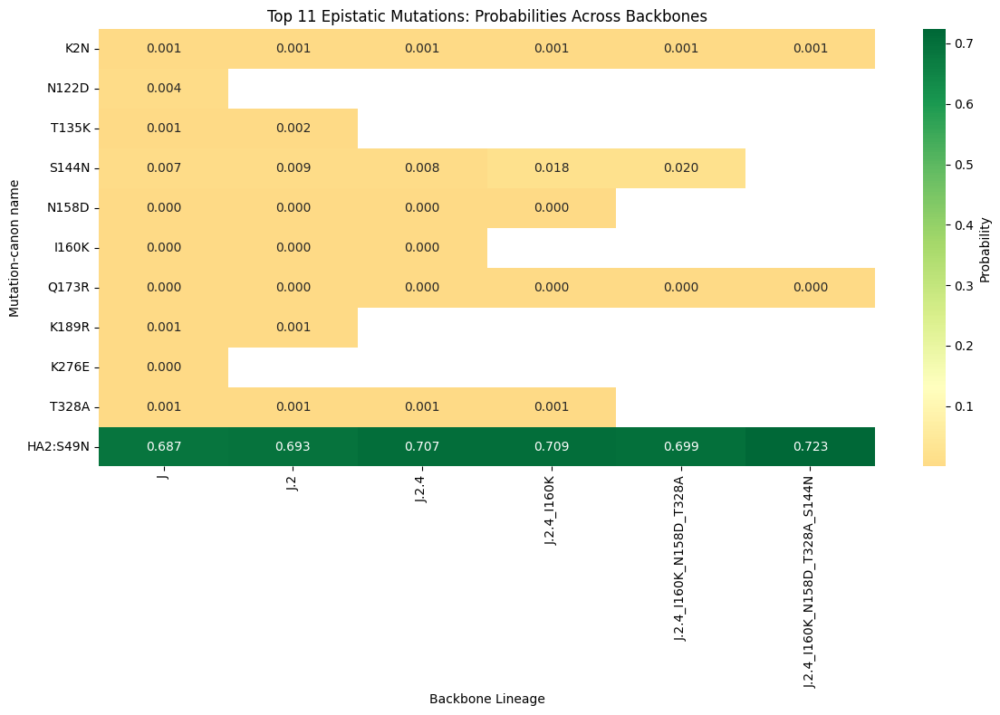

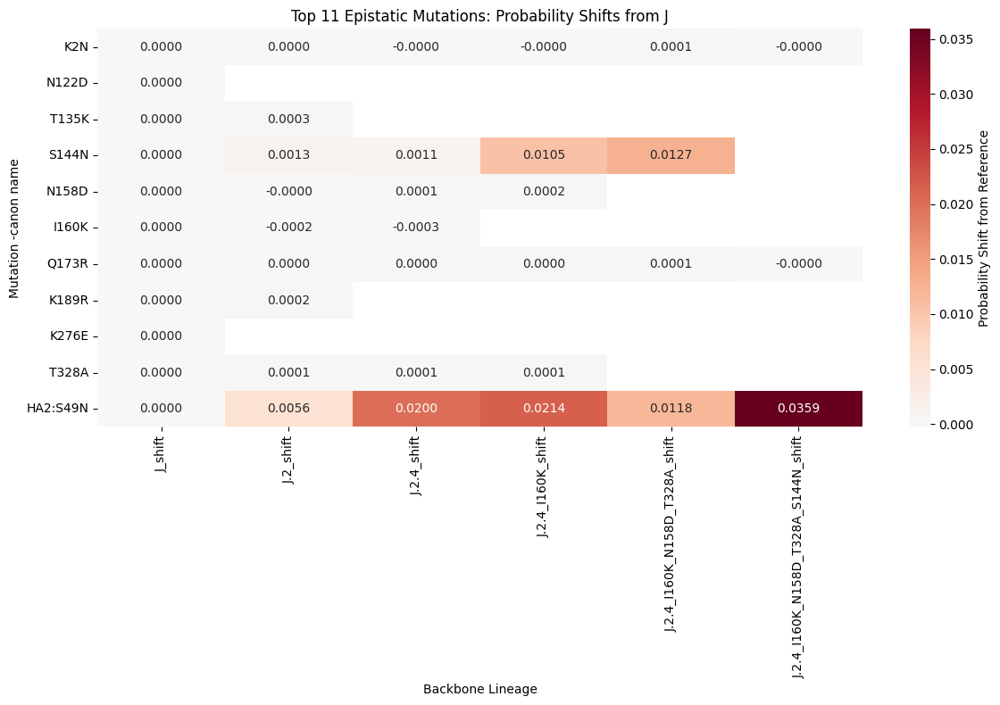

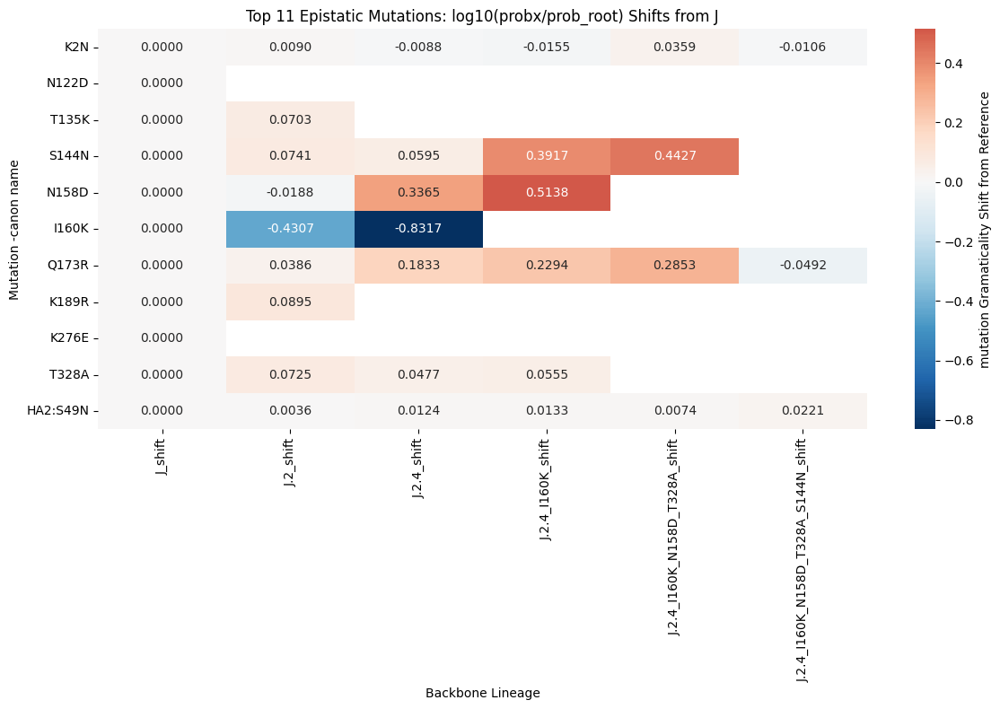


=== Strongest Epistatic Pairs ===
    Mutation   Strongest_Epistatic_Backbone  Probability_Shift  \
0        K2N        J.2.4_I160K_N158D_T328A           0.000051   
1      N122D                              J           0.000000   
2      T135K                            J.2           0.000256   
3      S144N        J.2.4_I160K_N158D_T328A           0.012710   
4      N158D                    J.2.4_I160K           0.000185   
5      I160K                          J.2.4          -0.000263   
6      Q173R        J.2.4_I160K_N158D_T328A           0.000060   
7      K189R                            J.2           0.000163   
8      K276E                              J           0.000000   
9      T328A                            J.2           0.000098   
10  HA2:S49N  J.2.4_I160K_N158D_T328A_S144N           0.035915   

    Ref_Probability  New_Probability  
0          0.000590         0.000641  
1          0.004096         0.004096  
2          0.001459         0.001715  
3          0.007

In [13]:
# Explore epistatic interactions by comparing mutation probabilities across backbones

# 1. Filter data to get mutations and their probabilities on different backbones
# Assuming backbone_mut_probs has columns: Mutation, probability, Backbone (or lineage_backbone)

# Get the reference backbone (J lineage)
reference_backbone = "J"  # Should be 'J.2.4' or similar
print(f"Reference backbone: {reference_backbone}")

# Get all unique backbones
all_backbones = backbone_mut_probs['lineage_backbone'].unique()
print(f"All backbones: {all_backbones}")

# 2. Create a pivot table: mutations as rows, backbones as columns, probability as values
prob_pivot = backbone_mut_probs.pivot_table(
    index='canon', 
    columns='lineage_backbone', 
    values='probability',
    aggfunc='first'  # In case of duplicates, take first
)

print(f"\nProbability pivot shape: {prob_pivot.shape}")
print(prob_pivot.head())

# 3. Calculate probability shifts relative to reference backbone
if reference_backbone in prob_pivot.columns:
    # Calculate difference from reference for each backbone
    prob_shifts = prob_pivot.copy()
    gram_shifts = prob_pivot.copy()
    for col in prob_pivot.columns:
        
        prob_shifts[f'{col}_shift'] = prob_pivot[col] - prob_pivot[reference_backbone]
        gram_shifts[f'{col}_shift'] = np.log10(prob_pivot[col] / prob_pivot[reference_backbone])
    
    # Get only the shift columns
    shift_cols = [col for col in prob_shifts.columns if '_shift' in col]
    prob_shifts_only = prob_shifts[shift_cols].copy()
    
    # 4. Find biggest shifts (epistatic interactions)
    # Calculate max absolute shift across all backbones for each mutation
    # Use skipna=True to ignore NaN values
    prob_shifts_only['max_abs_shift'] = prob_shifts_only[shift_cols].abs().max(axis=1, skipna=True)
    prob_shifts_only['max_shift'] = prob_shifts_only[shift_cols].max(axis=1, skipna=True)
    prob_shifts_only['min_shift'] = prob_shifts_only[shift_cols].min(axis=1, skipna=True)
    epistatic_ranking = prob_shifts_only[prob_shifts_only['max_abs_shift'].notna()].copy()
    # Add reference probability for context
    prob_shifts_only['ref_probability'] = prob_pivot[reference_backbone]
    
    # Filter out rows where all shifts are NaN (mutation not present in any other backbone)
    prob_shifts_only = prob_shifts_only[prob_shifts_only['max_abs_shift'].notna()]
    # Extract position numbers from canonical mutation names for sorting
    def extract_position(mutation_name):
        """Extract numeric position from mutation name for sorting"""
        # Handle HA2 mutations like "HA2:S49N"
        if mutation_name.startswith('HA2:'):
            match = re.search(r'HA2:[A-Z](\d+)', mutation_name)
            if match:
                return 10000 + int(match.group(1))  # Add 10000 to put HA2 after HA1
        # Handle signal peptide like "SP-15"
        elif mutation_name.startswith('SP'):
            match = re.search(r'SP-(\d+)', mutation_name)
            if match:
                return -int(match.group(1))  # Negative so SP comes first
        # Handle regular mutations and insertions like "S158N" or "N158AN"
        else:
            match = re.search(r'[A-Z](\d+)', mutation_name)
            if match:
                return int(match.group(1))
        return 0  # Fallback

    # Sort epistatic_ranking by genomic position
    epistatic_ranking['genomic_position'] = epistatic_ranking.index.map(extract_position)
    epistatic_ranking = epistatic_ranking.sort_values('genomic_position')

    # Update prob_shifts_only with the same order
    prob_shifts_only = prob_shifts_only.loc[epistatic_ranking.index]

    print("\n=== Top 20 Mutations with Largest Epistatic Shifts (Sorted by Genomic Position) ===")
    print(epistatic_ranking.head(20))
 
    
    # 5. Visualize top epistatic interactions
    import matplotlib.pyplot as plt
    import seaborn as sns
    
    # Heatmap of top 15 mutations across backbones
    top_n = min(15, len(epistatic_ranking))  # Don't try to show more than available
    top_mutations = prob_shifts_only.index
    
    # Get probability data for these mutations
    top_prob_data = prob_pivot.loc[top_mutations]
    
    plt.figure(figsize=(12, 8))
    sns.heatmap(top_prob_data, annot=True, fmt='.3f', cmap='RdYlGn', 
                center=top_prob_data.mean().mean(), cbar_kws={'label': 'Probability'},
                mask=top_prob_data.isna())  # Mask NaN values
    plt.title(f'Top {top_n} Epistatic Mutations: Probabilities Across Backbones')
    plt.xlabel('Backbone Lineage')
    plt.ylabel('Mutation-canon name')
    plt.tight_layout()
    plt.yticks(rotation=0) 
    plt.savefig(os.path.join(outdir,f"{model_name}_epistatic_heatmap.png"), dpi=300)
    plt.show()
    
    # 6. Create shift heatmap (with reference lineage showing zeros)
    plt.figure(figsize=(12, 8))
    shift_data = prob_shifts_only.loc[top_mutations, shift_cols].copy()
    # Add reference backbone column with calculated zeros (shift from itself)
    #shift_data[f'{reference_backbone}_shift'] = 0.0
    # Reorder columns to put reference first
    cols_ordered =  shift_cols
    shift_data = shift_data[cols_ordered]
    sns.heatmap(shift_data, annot=True, fmt='.4f', cmap='RdBu_r', 
                center=0, cbar_kws={'label': 'Probability Shift from Reference'},
                mask=shift_data.isna())  # Mask NaN values
    plt.title(f'Top {top_n} Epistatic Mutations: Probability Shifts from {reference_backbone}')
    plt.xlabel('Backbone Lineage')
    plt.ylabel('Mutation -canon name')
    plt.yticks(rotation=0) 
    plt.tight_layout()
    plt.savefig(os.path.join(outdir,f"{model_name}_epistatic_shifts.png"), dpi=300)
    plt.show()

    # 7. Create grammar heatmap (with reference lineage showing zeros)
    plt.figure(figsize=(12, 8))
    gram_data = gram_shifts.loc[top_mutations, shift_cols].copy()
    # Add reference backbone column with calculated zeros (log10(1) = 0)
    #gram_data[f'{reference_backbone}_shift'] = 0.0
    # Reorder columns to put reference first
    cols_ordered =  shift_cols
    gram_data = gram_data[cols_ordered]
    sns.heatmap(gram_data, annot=True, fmt='.4f', cmap='RdBu_r', 
                center=0, cbar_kws={'label': 'mutation Gramaticality Shift from Reference'},
                mask=gram_data.isna())  # Mask NaN values
    plt.title(f'Top {top_n} Epistatic Mutations: log10(probx/prob_root) Shifts from {reference_backbone}')
    plt.xlabel('Backbone Lineage')
    plt.ylabel('Mutation -canon name')
    plt.tight_layout()
    plt.yticks(rotation=0) 
    plt.savefig(os.path.join(outdir,f"{model_name}_epistatic_shifts_gram.png"), dpi=300)
    plt.show()
    
    # 8. Identify specific epistatic pairs (which backbone causes biggest shift for each mutation)
    epistatic_pairs = []
    for mutation in top_mutations:
        shifts = prob_shifts_only.loc[mutation, shift_cols]
        # Skip if all shifts are NaN
        if shifts.notna().sum() == 0:
            continue
            
        # Get the column with max absolute shift (ignoring NaN)
        max_shift_col = shifts.abs().idxmax(skipna=True)
        
        # Skip if max_shift_col is NaN
        if pd.isna(max_shift_col):
            continue
            
        max_shift_val = shifts[max_shift_col]
        backbone_name = max_shift_col.replace('_shift', '')
        
        epistatic_pairs.append({
            'Mutation': mutation,
            'Strongest_Epistatic_Backbone': backbone_name,
            'Probability_Shift': max_shift_val,
            'Ref_Probability': prob_shifts_only.loc[mutation, 'ref_probability'],
            'New_Probability': prob_pivot.loc[mutation, backbone_name] if backbone_name in prob_pivot.columns else np.nan
        })
    
    epistatic_pairs_df = pd.DataFrame(epistatic_pairs)
    print("\n=== Strongest Epistatic Pairs ===")
    print(epistatic_pairs_df)
    
    # Save results
    epistatic_ranking.to_csv(os.path.join(outdir,
        f"{model_name}_epistatic_ranking.csv")
    )
    epistatic_pairs_df.to_csv(os.path.join(outdir,
        f"{model_name}_epistatic_pairs.csv"),
        index=False
    )
    
    print(f"\nSaved epistatic analysis to Results/test/")
    
else:
    print(f"Error: Reference backbone '{reference_backbone}' not found in data")
    print(f"Available backbones: {prob_pivot.columns.tolist()}")

['S144N', 'N158D', 'I160K', 'Q173R', 'T328A', 'HA2:S49N', 'K2N']


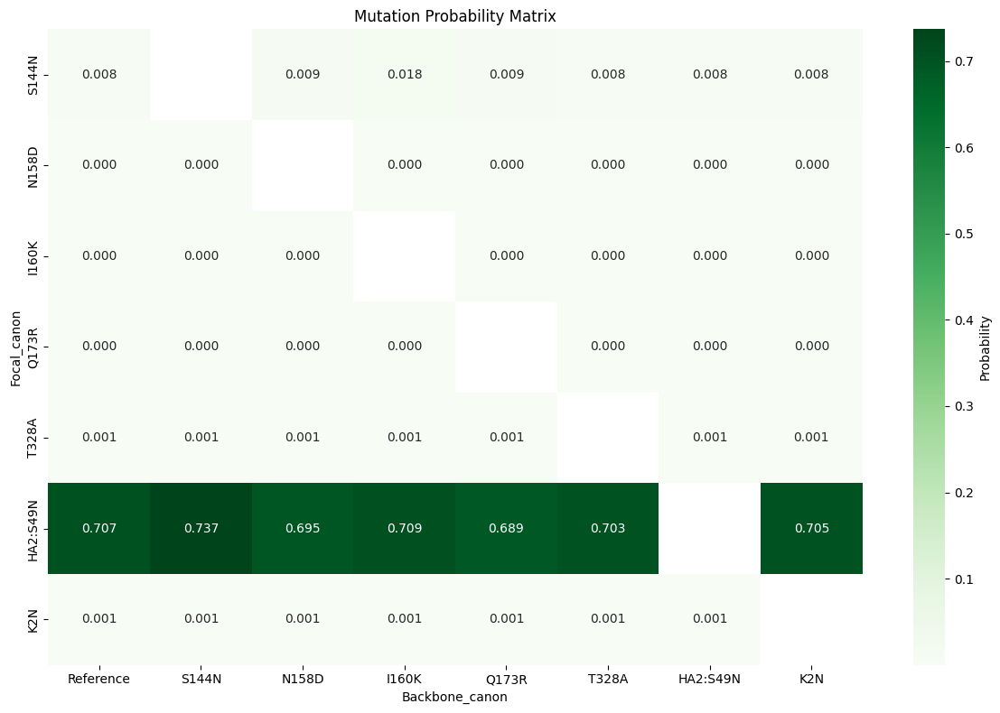

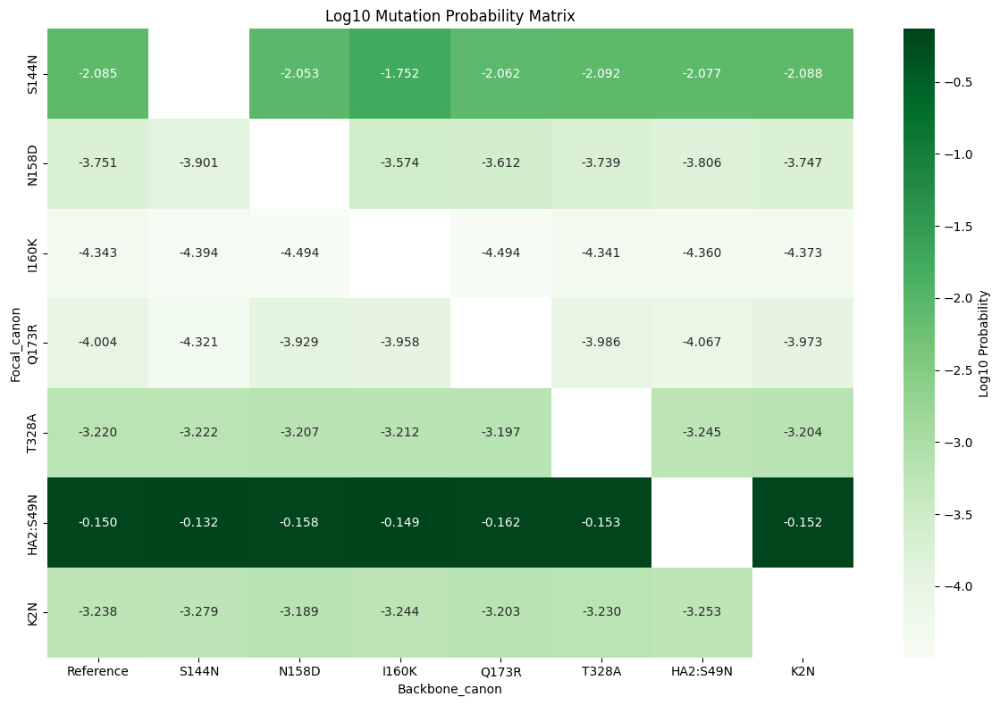

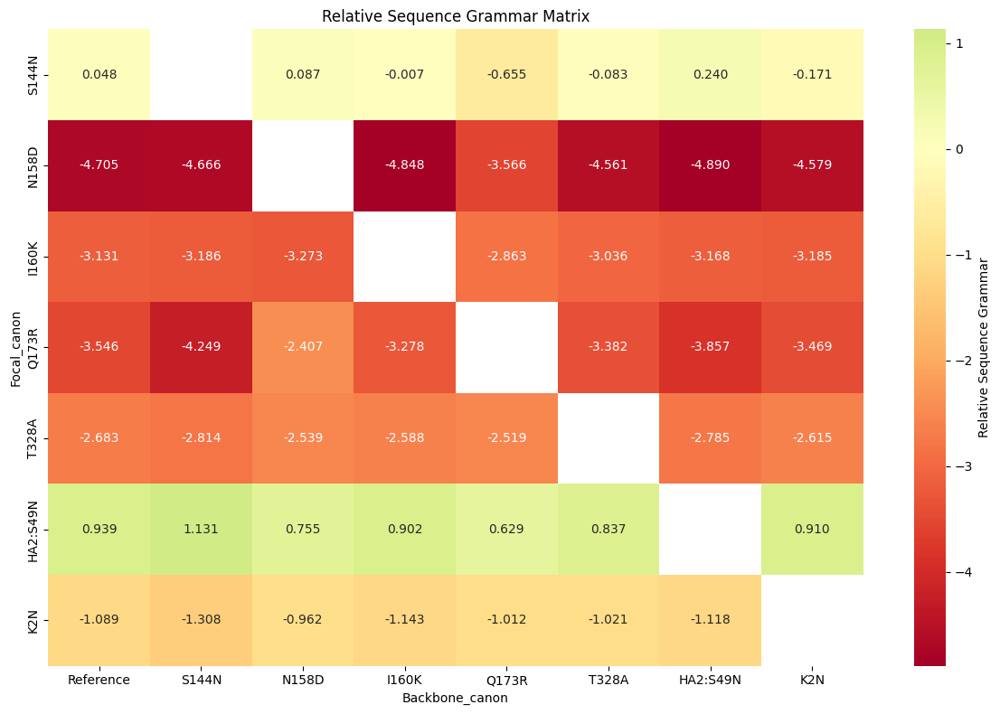

In [14]:

mut_combos.head()


# Create pivot tables for probability and relative sequence grammar
mut_combo_probability_matrix = mut_combos.pivot_table(
    index='Focal_canon', 
    columns='Backbone_canon', 
    values='probability'
)

mut_combo_grammar_matrix = mut_combos.pivot_table(
    index='Focal_canon', 
    columns='Backbone_canon',
    values='rel_seq_grammar'
)

original_order = mut_combos['Focal_canon'].unique().tolist()
print(original_order)
# 2. Filter out 'Reference' if it exists in the original list
#    This ensures 'Reference' only appears once.
filtered_order = [c for c in original_order if c != 'Reference']

# 3. Concatenate the lists to place 'Reference' first
cols = ['Reference'] + filtered_order
mut_combo_probability_matrix = mut_combo_probability_matrix[cols]
mut_combo_grammar_matrix = mut_combo_grammar_matrix[cols]
# now sort rows by filtered_order
mut_combo_probability_matrix = mut_combo_probability_matrix.loc[filtered_order, cols]
mut_combo_grammar_matrix = mut_combo_grammar_matrix.loc[filtered_order, cols]
# Plot Probability Matrix
plt.figure(figsize=(12, 8))
sns.heatmap(mut_combo_probability_matrix, annot=True, fmt='.3f', cmap='Greens', 
            cbar_kws={'label': 'Probability'})
plt.title('Mutation Probability Matrix')
plt.tight_layout()
plt.show()

# Plot Log10 Probability Matrix
plt.figure(figsize=(12, 8))
sns.heatmap(np.log10(mut_combo_probability_matrix), annot=True, fmt='.3f', cmap='Greens', 
            cbar_kws={'label': 'Log10 Probability'})
plt.title('Log10 Mutation Probability Matrix')
plt.tight_layout()
plt.show()

# Plot Relative Sequence Grammar Matrix
plt.figure(figsize=(12, 8))
sns.heatmap(mut_combo_grammar_matrix, annot=True, fmt='.3f', cmap='RdYlGn', center=0,
            cbar_kws={'label': 'Relative Sequence Grammar'})
plt.title('Relative Sequence Grammar Matrix')
plt.tight_layout()
plt.show()

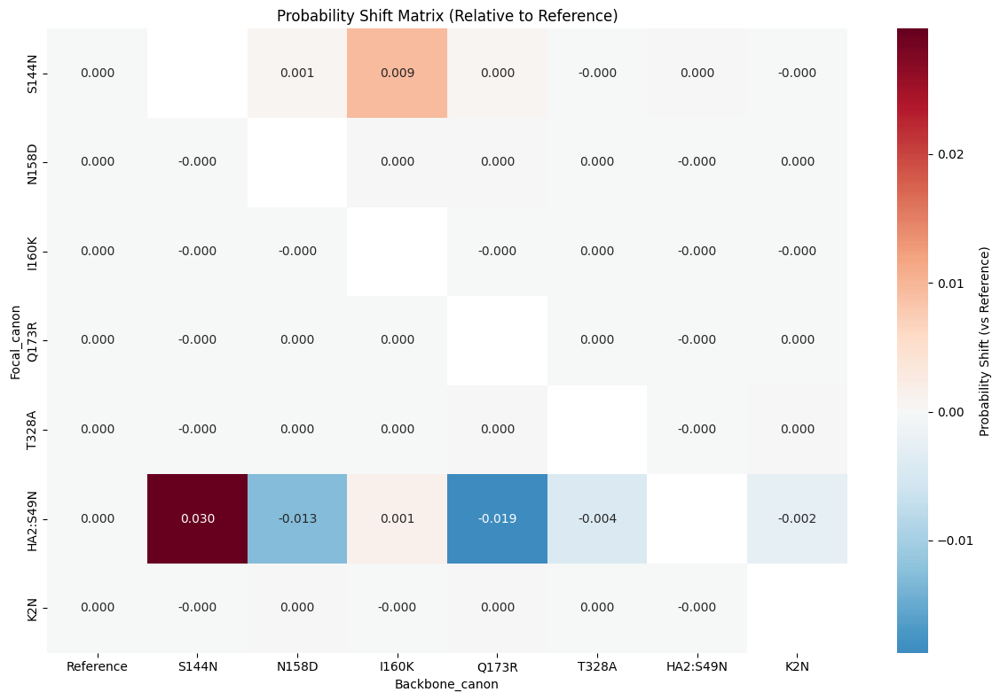

/home3/oml4h/miniconda3/envs/plm_entropy/lib/python3.12/site-packages/pandas/core/internals/blocks.py:393: RuntimeWarning: invalid value encountered in log10
  result = func(self.values, **kwargs)


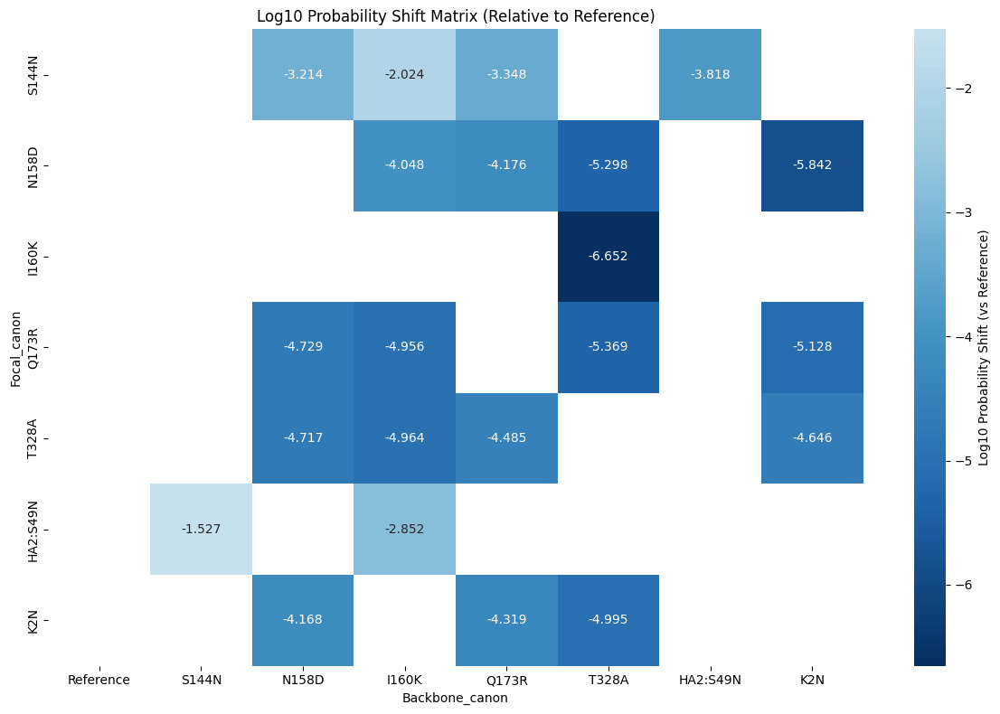

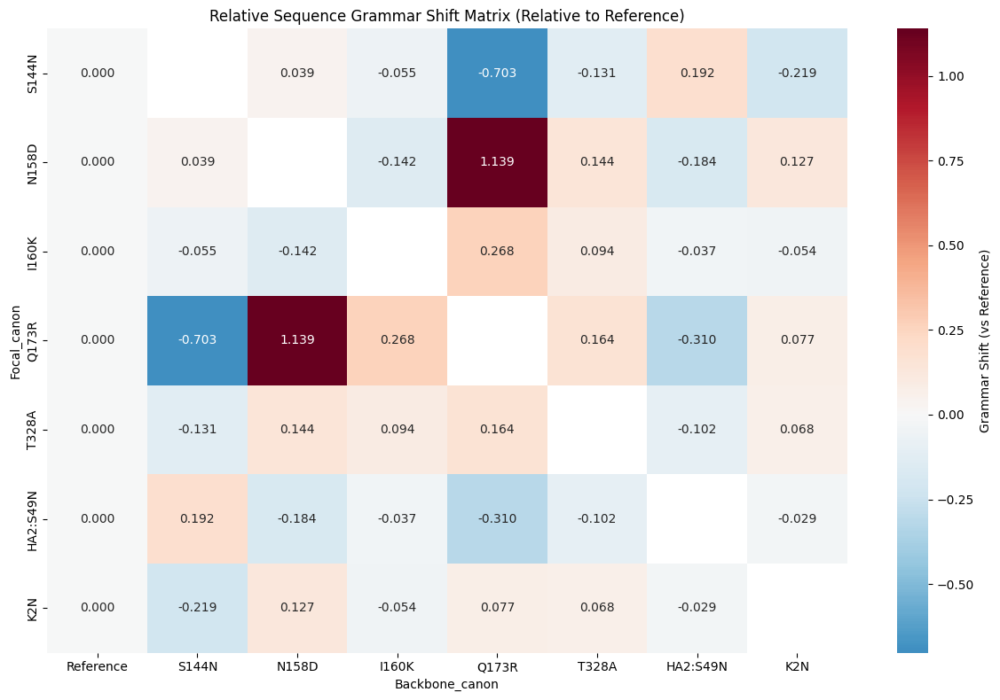

In [15]:

# --- Relative Shift Plots ---

# 1. Probability Shift (Prob - Ref_Prob)
prob_shift_matrix = mut_combo_probability_matrix.subtract(mut_combo_probability_matrix['Reference'], axis=0)


plt.figure(figsize=(12, 8))
sns.heatmap(prob_shift_matrix, annot=True, fmt='.3f', cmap='RdBu_r', center=0,
            cbar_kws={'label': 'Probability Shift (vs Reference)'})
plt.title('Probability Shift Matrix (Relative to Reference)')
plt.tight_layout()
plt.show()

# 2. log the probability shifts
log_prob_shift_matrix = np.log10(prob_shift_matrix + 1e-10)
log_prob_shift_matrix.iloc[:,0]= np.nan


plt.figure(figsize=(12, 8))
sns.heatmap(log_prob_shift_matrix, annot=True, fmt='.3f', cmap='RdBu_r', center=0,
            cbar_kws={'label': 'Log10 Probability Shift (vs Reference)'})
plt.title('Log10 Probability Shift Matrix (Relative to Reference)')
plt.tight_layout()
plt.show()

# 3. Relative Sequence Grammar Shift (Grammar - Ref_Grammar)
grammar_shift_matrix = mut_combo_grammar_matrix.subtract(mut_combo_grammar_matrix['Reference'], axis=0)

plt.figure(figsize=(12, 8))
sns.heatmap(grammar_shift_matrix, annot=True, fmt='.3f', cmap='RdBu_r', center=0,
            cbar_kws={'label': 'Grammar Shift (vs Reference)'})
plt.title('Relative Sequence Grammar Shift Matrix (Relative to Reference)')
plt.tight_layout()
plt.show()